In [1]:
import rasterio as rio
from rasterio.plot import show
import geopandas as gpd
from glob import glob
import numpy as np
import matplotlib.pyplot as plt
import folium
import os, sys
import fnmatch
from TOA_Reflectance_Stacker import histogram_stretch
from tqdm import tqdm
import earthpy.plot as ep
import shapely
from sklearn import cluster
from rasterio.plot import reshape_as_image
import matplotlib.patches as mpatches
from datetime import datetime
from matplotlib.colors import ListedColormap
from landsat_qa_pixel_parser import run_qa_parser, qa_pixel_interp_conservative
import pandas as pd

In [4]:
def landsat_l2_scaling(stacked_mb_raster):    
    '''
    stacked_mb_raster = filepath to raster to be scaled
    
    returns 3D numpy array of the scaled, stacked bands as well as the profile information
    '''
    with rio.open(stacked_mb_raster) as src:
        profile = src.profile
        stack = src.read()
        src.close()

    # change the stack from DNs to reflectances
    # remember temperature uses a different scaling factor (temp is in Kelvin)
    scaled_stack = stack[:-1,...] * 0.0000275 - 0.2
    scaled_temp = stack[-1,...] * 0.00341802 + 149.0 

    # need to change scaled_temp from 2D to 3D
    scaled_stack = np.vstack((scaled_stack, np.expand_dims(scaled_temp, axis = 0))) 
    
    return scaled_stack, profile

In [13]:
scenes = ['LC08_L2SP_113037_20210325_20210402_02_T1', 'LC08_L2SP_113037_20210104_20210308_02_T1']

scene_dict = {}

for scene in scenes:
    scaled_stack, profile = landsat_l2_scaling(f"{scene}/{scene}_STACKED.tif")
        
    scene_dict[scene] = [scaled_stack]

In [14]:
# grab 'ground truth' data from maps
# want to try and get the most amount of variation in a single land-use type

land_use_0325 = gpd.read_file("land_use_training_set_20210325.geojson")
land_use_0325 = land_use_0325.to_crs('EPSG:32652')
print(land_use_0325.crs)

print(land_use_0325.LULC.unique())

land_use_0104 = gpd.read_file("land_use_training_set_20210104.geojson")
land_use_0104 = land_use_0104.to_crs('EPSG:32652')
print(land_use_0104.crs)

print(land_use_0104.LULC.unique())

EPSG:32652
['Forest' 'Water' 'Urban' 'Bare Land' 'Cropland']
EPSG:32652
['Forest' 'Water' 'Urban' 'Bare Land' 'Cropland']


In [15]:
scene_dict['LC08_L2SP_113037_20210325_20210402_02_T1'].append(land_use_0325)
scene_dict['LC08_L2SP_113037_20210104_20210308_02_T1'].append(land_use_0104)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


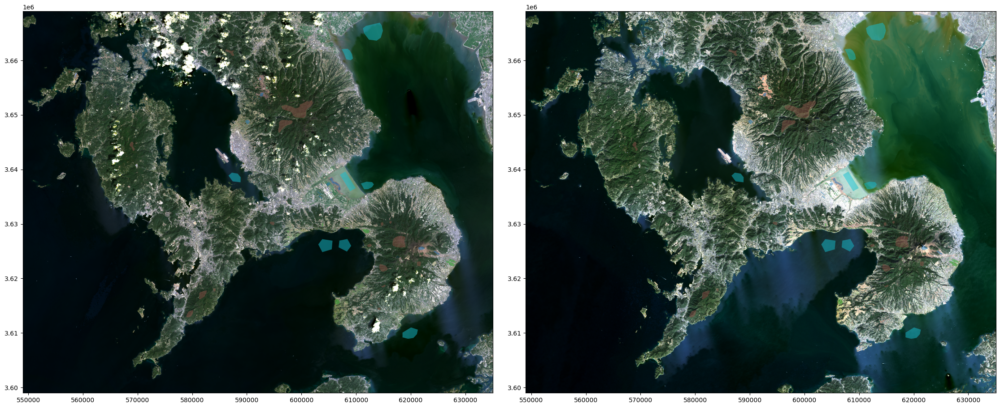

In [16]:
fig, axs = plt.subplots(1,2,figsize = (28,18), gridspec_kw={'wspace': 0.07})

for idx, scene in enumerate(scene_dict.keys()):
    show(histogram_stretch(scene_dict[scene][0][[3,2,1]]), ax = axs[idx], transform = profile["transform"])
    scene_dict[scene][1].plot(column = "LULC", alpha = 0.5, ax = axs[idx])

In [17]:
# To prep the data for ML analysis, we need two numpy arrays:
# X: a numpy array that contains all of the band data for the pixel
# y: the labels for training
X_train = np.array([], dtype = np.float32).reshape(0,8) # Create an array with 8 columns and 0 rows
                                                  # we're gonna stack new pixels inside
y_train = np.array([], dtype = np.string_) # labels for training

# note that although we have scaled_stack, rio.mask.mask requires a dataset in read mode
# We collect the training data for both scenes
for scene in scene_dict.keys():
    with rio.open(f"{scene}/{scene}_STACKED.tif") as src:
        profile = src.profile

        # Iterate over each polygon in our landuse ground truth dataset
        for index, row in scene_dict[scene][1].iterrows():
            feature = [row["geometry"]]

            # crop the image - mask function returns a tuple
            out_image, out_transform = rio.mask.mask(src, feature, crop = True)

            # out_image has a shape (8, height, width)
            # Since this returns a rectangular array, and our shape is not rectangular, there will be
            # a bunch of nodata - get rid of them.

            # ~np.any(np.isnan(out_image), axis = 0) if any of the bands are np.nan

            # note that this gets rid of any column that has ANY nans
            # The following code returns a column for each band, with each row representing a pixel
            out_image_trimmed = out_image[:, ~np.any(out_image == profile['nodata'], axis = 0)]

            # We actually want this the other way around - we want a row for pixel, and a column for each
            # band - so we transpose the image
            out_image_trimmed = out_image_trimmed.T

            out_bands = out_image_trimmed[:,:-1] * 0.0000275 - 0.2
            out_temp = out_image_trimmed[:,-1] * 0.00341802 + 149.0 

            out_raster = np.hstack((out_bands, np.expand_dims(out_temp, axis = 1)))

            # We append the labels to the answer array equal to the number of pixels:
            # Remember to put brackets around the row["LULC"], or else you'll get "forestforestforest"
            # out_image_trimmed.shape[0] is the number of pixels in the training data
            y_train = np.append(y_train, [row["LULC"]] * out_raster.shape[0])

            # vstack is like concat for rows. Note that to vstack correctly, the array tuple that you feed
            # to vstack must have the same column dimension
            X_train = np.vstack((X_train, out_raster))

    src.close()

In [18]:
# should be double that of the single scene training, which it is
print(X_train.shape)
print(y_train.shape)

(144103, 8)
(144103,)


In [19]:
# We can try other models and consider doing some hyperparameter tuning
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import RandomizedSearchCV

# we use LinearSVC because SVC scales poorly with large numbers of samples
svc_pipeline = make_pipeline(
    StandardScaler(),
    LinearSVC()
)

# dictionary or list of dictionaries showing the hyperparameters to be tuned
# need to use the clf__ prefix to distinguish between multiple parts of the pipeline
# for example, if you are using PCA parameters or TDIFD vectorizers
parameter_grid = [
    {
        'linearsvc__penalty': ['l1'], 
        'linearsvc__C': [1, 10, 100, 1000]
    },
    {
        'linearsvc__penalty': ['l2'],
        'linearsvc__C': [1, 10, 100, 1000], 
        'linearsvc__loss': ['hinge', 'squared_hinge']
    }
]

# This does a random cross-validated search of the parameter grid
# if you don't specify cv, automatically uses cv = 5
# should actually use GridSearchCV for an exhaustive search of the grid
random_svc_search = RandomizedSearchCV(
    estimator=svc_pipeline,
    param_distributions=parameter_grid,
    n_iter=40,
    random_state=0,
    n_jobs=2,
    verbose=1,
    scoring = ('accuracy', 'f1_macro'), # list of scorers that the cv search should be scored by
    refit = 'f1_macro'                  # if using multiple scorers, sets which scorer should be used for best_params
)

random_svc_search

RandomizedSearchCV(estimator=Pipeline(steps=[('standardscaler',
                                              StandardScaler()),
                                             ('linearsvc', LinearSVC())]),
                   n_iter=40, n_jobs=2,
                   param_distributions=[{'linearsvc__C': [1, 10, 100, 1000],
                                         'linearsvc__penalty': ['l1']},
                                        {'linearsvc__C': [1, 10, 100, 1000],
                                         'linearsvc__loss': ['hinge',
                                                             'squared_hinge'],
                                         'linearsvc__penalty': ['l2']}],
                   random_state=0, refit='f1_macro',
                   scoring=('accuracy', 'f1_macro'), verbose=1)

In [20]:
%%time

random_svc_search.fit(X_train, y_train)

C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\sklearn\model_selection\_search.py:307: UserWarning: The total space of parameters 12 is smaller than n_iter=40. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 5 folds for each of 12 candidates, totalling 60 fits


C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
20 fits failed out of a total of 60.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
20 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\sklearn\pipeline.py", line 4

CPU times: total: 38 s
Wall time: 23min 29s


C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\sklearn\svm\_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


RandomizedSearchCV(estimator=Pipeline(steps=[('standardscaler',
                                              StandardScaler()),
                                             ('linearsvc', LinearSVC())]),
                   n_iter=40, n_jobs=2,
                   param_distributions=[{'linearsvc__C': [1, 10, 100, 1000],
                                         'linearsvc__penalty': ['l1']},
                                        {'linearsvc__C': [1, 10, 100, 1000],
                                         'linearsvc__loss': ['hinge',
                                                             'squared_hinge'],
                                         'linearsvc__penalty': ['l2']}],
                   random_state=0, refit='f1_macro',
                   scoring=('accuracy', 'f1_macro'), verbose=1)

In [21]:
# This allows you to create a dataframe of the scoring results
# it contains a list of all results for each split for all metrics given
svc_cv_results = pd.DataFrame.from_dict(random_svc_search.cv_results_, orient = "columns")

# We can see that teh best model had an accuracy of 94% and a mean f1 score of 0.733
# Compare this to the GNB f1 score of 0.74 and the original 0.88
svc_cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_linearsvc__penalty,param_linearsvc__C,param_linearsvc__loss,params,split0_test_accuracy,split1_test_accuracy,...,std_test_accuracy,rank_test_accuracy,split0_test_f1_macro,split1_test_f1_macro,split2_test_f1_macro,split3_test_f1_macro,split4_test_f1_macro,mean_test_f1_macro,std_test_f1_macro,rank_test_f1_macro
0,0.101777,0.007309,0.000000,0.000000,l1,1,NaN,"{'linearsvc__penalty': 'l1', 'linearsvc__C': 1}",NaN,NaN,...,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
1,0.094922,0.008363,0.000000,0.000000,l1,10,NaN,"{'linearsvc__penalty': 'l1', 'linearsvc__C': 10}",NaN,NaN,...,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
2,0.094957,0.006521,0.000000,0.000000,l1,100,NaN,"{'linearsvc__penalty': 'l1', 'linearsvc__C': 100}",NaN,NaN,...,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
3,0.097870,0.008080,0.000000,0.000000,l1,1000,NaN,"{'linearsvc__penalty': 'l1', 'linearsvc__C': 1...",NaN,NaN,...,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
4,6.466005,1.828803,0.154770,0.046414,l2,1,hinge,"{'linearsvc__penalty': 'l2', 'linearsvc__loss'...",0.926928,0.963846,...,0.012467,4,0.615698,0.770763,0.702765,0.718170,0.736481,0.708776,0.051765,4
5,42.340566,2.694046,0.116780,0.016494,l2,1,squared_hinge,"{'linearsvc__penalty': 'l2', 'linearsvc__loss'...",0.933694,0.968912,...,0.012224,2,0.676517,0.849417,0.727752,0.702544,0.725471,0.736340,0.059497,1
6,48.525823,3.187430,0.113939,0.008113,l2,10,hinge,"{'linearsvc__penalty': 'l2', 'linearsvc__loss'...",0.926651,0.969675,...,0.013842,1,0.630884,0.835065,0.745370,0.718280,0.739491,0.733818,0.065197,2
7,76.759716,2.263333,0.105392,0.002683,l2,10,squared_hinge,"{'linearsvc__penalty': 'l2', 'linearsvc__loss'...",0.929565,0.965858,...,0.012519,3,0.640063,0.819233,0.710353,0.726537,0.723267,0.723891,0.057110,3
8,87.371522,3.417672,0.103101,0.006026,l2,100,hinge,"{'linearsvc__penalty': 'l2', 'linearsvc__loss'...",0.923806,0.944416,...,0.009269,7,0.623530,0.699713,0.692101,0.760179,0.609419,0.676988,0.054934,7
9,91.810378,2.567889,0.112886,0.012748,l2,100,squared_hinge,"{'linearsvc__penalty': 'l2', 'linearsvc__loss'...",0.921481,0.942230,...,0.012664,6,0.602609,0.712174,0.639415,0.792674,0.656998,0.680774,0.066171,6


In [22]:
svc_cv_results[["mean_test_accuracy", "mean_test_f1_macro"]]

,mean_test_accuracy,mean_test_f1_macro
0,NaN,NaN
1,NaN,NaN
2,NaN,NaN
3,NaN,NaN
4,0.943645,0.708776
5,0.945761,0.736340
6,0.946580,0.733818
7,0.944970,0.723891
8,0.936219,0.676988
9,0.936677,0.680774


In [26]:
# nagasaki_pred currently a bunch of strings - convert to integers
lulc_dict = dict((
    ("Urban", 0),
    ("Cropland", 1),
    ("Forest", 2),
    ("Water", 3),
    ("Bare Land", 4),
))

# Invert dictionary
inv_dict = {v: k for k, v in lulc_dict.items()}

colors = ["grey", "xkcd:lime green", "green", "blue", "brown"]
cmap = ListedColormap(colors)

In [24]:
for scene in scene_dict.keys():
    X_test = scene_dict[scene][0].swapaxes(0, 2).reshape(-1, 8)
    
    y_pred = random_svc_search.predict(X_test)
    nagasaki_pred = y_pred.reshape(scene_dict[scene][0].shape[2], scene_dict[scene][0].shape[1]).T
    
    u, inv = np.unique(nagasaki_pred, return_inverse = True)
    nagasaki_pred = np.array([lulc_dict[x] for x in u])[inv].reshape(nagasaki_pred.shape)
    
    scene_dict[scene].append(nagasaki_pred)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


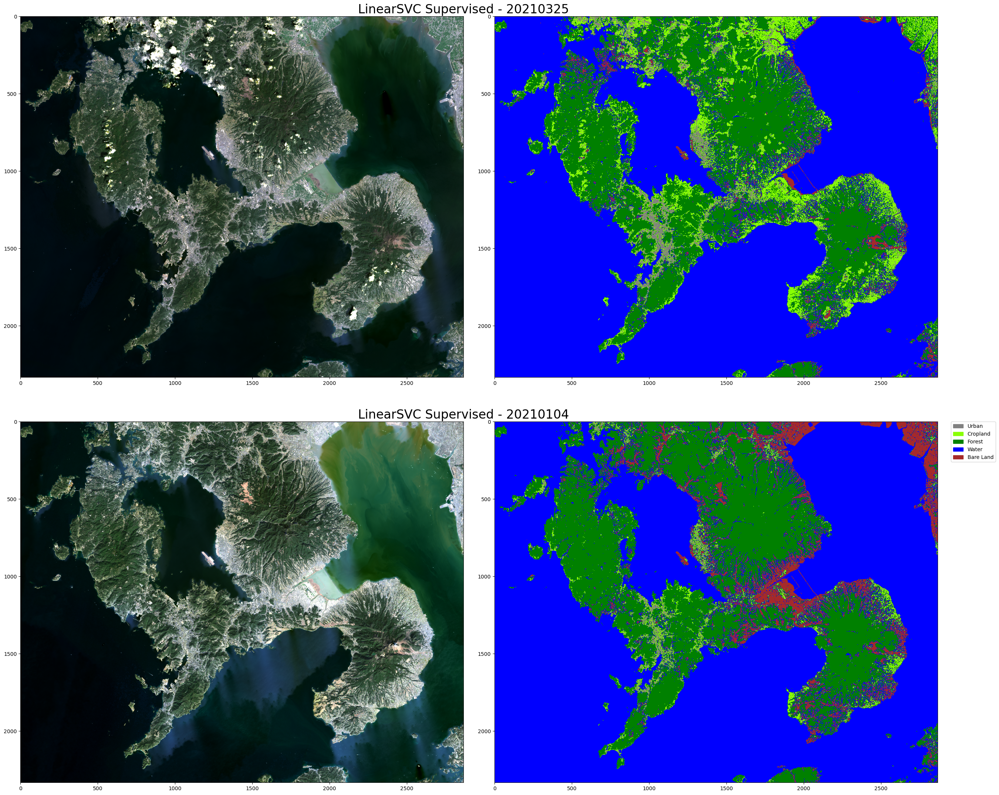

In [31]:
fig, axs = plt.subplots(2,2,figsize = (32,32), gridspec_kw={'wspace': 0.07, 'hspace': -0.2})

axs = axs.flatten()
idx = 0

for scene in scene_dict.keys():
    show(histogram_stretch(scene_dict[scene][0][[3,2,1]]), ax = axs[idx])
    show(scene_dict[scene][2], cmap = cmap, ax = axs[idx+1])
    
    title = axs[idx].set_title(f"LinearSVC Supervised - {scene.split('_')[3]}", fontsize = 24)
    title.set_position([1, 1.05])
    
    idx += 2
    
patches = [mpatches.Patch(color=colors[i], label = inv_dict[i]) for i in range(len(np.unique(nagasaki_pred))) ]
plt.legend(handles=patches, bbox_to_anchor=(1.03, 1), loc=2, borderaxespad=0. )

In [32]:
from joblib import dump

dump(random_svc_search.best_estimator_, "supervised_linearsvc_multiscene.joblib")

['supervised_linearsvc_multiscene.joblib']